In [2]:
%load_ext autoreload
%autoreload 2

# Import libraries

In [3]:
import numpy as np
import numpy.matlib
import pandas as pd
import scanpy as sc
from scanpy.external.pp import magic
import scipy
from sklearn.metrics import adjusted_rand_score
from scipy.stats.mstats import zscore
from scipy.stats import pearsonr
import csv
import os
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from copy import deepcopy
import timeit
from joblib import Parallel, delayed
from collections import Counter
np.random.seed(0)


# Define functions

In [4]:
def qc_metrics(adata, path_RB=''):
    mito_genes = adata.var_names.str.startswith('MT.')
    adata.var['mito'] = mito_genes
    mito_genes = np.array(adata.var.index)[mito_genes]
    
    path_RB = path_RB+'RB_genes_human'
    with open(path_RB,'r') as file:
        lines = file.readlines()
    RB_genes = [x.rstrip('\n') for x in lines]
    data_genes = list(adata.var.index)
    RB_genes_in_data = set(data_genes).intersection(RB_genes)
    RB_genes_in_data = list(RB_genes_in_data)
    
    adata.var['ribo'] = False
    adata.var.loc[RB_genes_in_data, 'ribo'] = True
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=('mito', 'ribo'), inplace=True)
    adata.obs['original_total_counts'] = adata.obs['total_counts']
    adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])
    print('QC metrics calculated.')
    
    return adata, mito_genes, RB_genes_in_data

In [5]:
def norm_filter(adata, mito_genes, RB_genes_in_data, log=True, remove_ribo=True, remove_mito=True, highly_var=False, markers=[]):
    
    adata.layers['raw_counts'] = adata.X
    # filter genes expressed in few cells
    print(adata.shape)
    sc.pp.filter_genes(adata, min_cells = 10)
    print(adata.shape)
    
    # libsize normalize
    if type(adata.X)==np.ndarray:
        med_libsize = np.median(np.sum(adata.X, axis=1))
    else:
        sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        #med_libsize = np.median(sums)
        if min(sums) == 0:
            empty_cells = set(np.where(sums==0)[0])
            print('# of 0-count droplets: '+str(len(empty_cells)))
            all_cells = set(adata.obs.index)
            keep_cells = all_cells-empty_cells
            adata = adata[keep_cells, :]
            sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        med_libsize = np.median(sums)

        print('Median library size: ' + str(med_libsize))

    sc.pp.normalize_total(adata)

    # log transform
    if log:
        adata.X = np.log2(adata.X+0.1) - np.log2(0.1)

        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = adata[:,i].X
            except:
                markers.remove(i)
                print(i)

    else:
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = np.log2(adata[:,i].X+0.1)
            except:
                markers.remove(i)
                print(i)

    # remove ribosomal genes
    if remove_ribo:
        RB_genes_in_data.append('MALAT1')
        adata = adata[:,[x not in RB_genes_in_data for x in adata.var.index]]
        print(adata.shape)

    # remove mitochondrial genes
    if remove_mito:
        adata = adata[:,[x not in mito_genes for x in adata.var.index]]
        print(adata.shape)

    # highly variable gene selection
    print(highly_var)
    if highly_var:
        if not log:
            print('Im not logged')
            sc.pp.highly_variable_genes(adata, layer='raw_counts', flavor='seurat_v3',max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))
            print(adata.shape)
        elif log:
            print('Im logged')
            sc.pp.highly_variable_genes(adata, layer=None, flavor='cell_ranger', max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))

    return adata, markers#adata_unlog, markers

In [6]:
def plot_pca(adata):
    
    print(adata.X)
    try:
        print(adata.shape)
        N = 1000
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    except:
        print(adata.shape) 
        N = min(adata.shape) - 1
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    
    #Plot variance explained
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = adata_new.uns['pca']['variance_ratio']
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Fraction of variance explained')
    plt.title('Fraction of variance explained per PC')
    plt.show()
    
    #Plot cumulative variance
    cml_var_explained = np.cumsum(adata_new.uns['pca']['variance_ratio'])
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = cml_var_explained
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Cumulative fraction of variance explained')
    plt.title('Cumulative fraction of variance explained by PCs')
    plt.show()
    
    return cml_var_explained, adata_new.uns['pca']['variance_ratio']
    
def kneepoint(vec):
    #print("I am in here 4")
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * numpy.matlib.repmat(lineVecNorm, nPoints, 1), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    
    return idxOfBestPoint
    
def run_pca_knee(adata):
    cml, var = plot_pca(adata)

    knee = kneepoint(var)
    
    print("Knee point: "+str(knee))
    print("Explained variance: " + str(cml[knee]))

    x=list(range(len(cml)))
    plt.plot(x[:5*knee],cml[:5*knee])
    plt.show()

    adata_new = sc.tl.pca(adata, n_comps=knee+1, copy=True)
    sc.pl.pca_loadings(adata_new, components=range(1,4))
    
    return adata_new

In [7]:
godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

# Populate input parameters

In [8]:
indir = '../../input/'
outdir = '../../CX3_output/'
figures = '../../figures/'

**Import Adata object without doublets**

In [8]:
adata_clean = sc.read_h5ad(outdir+'adata_CX3_clean_clust_normalized.h5ad')

# Cell indentities

## UMAP all cells

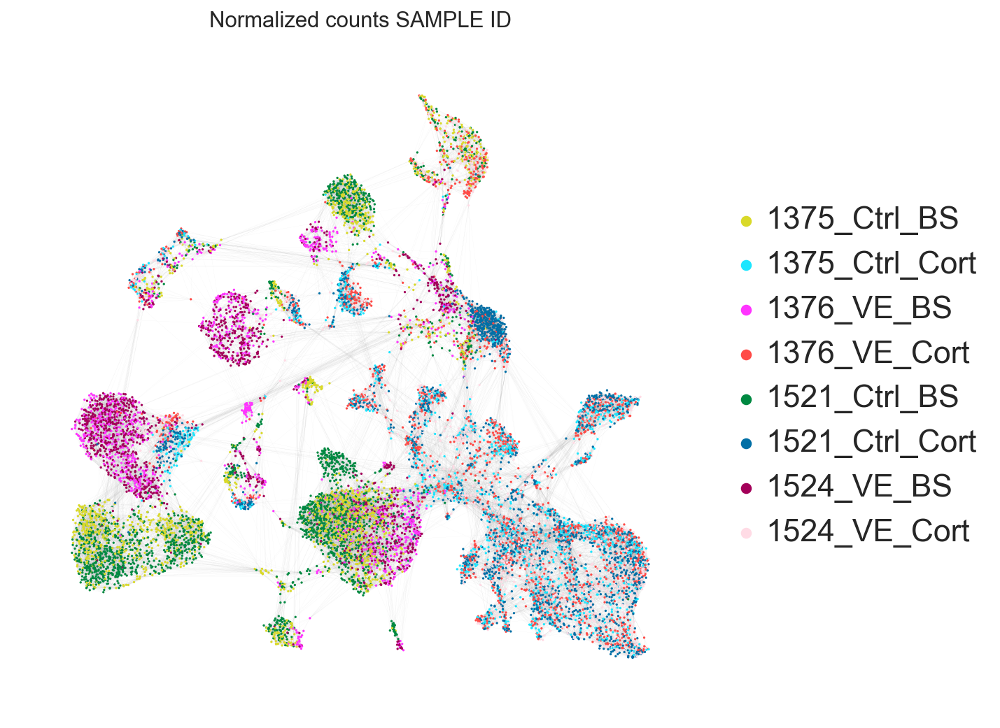

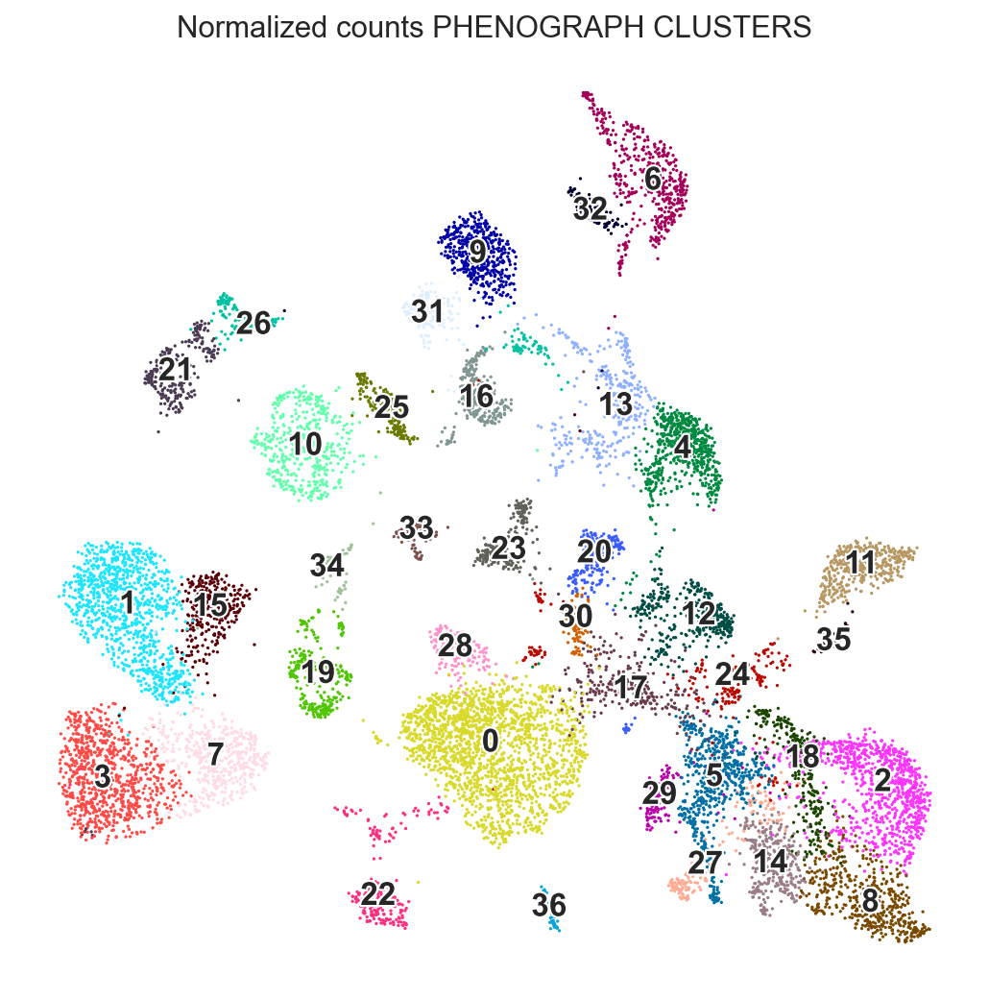

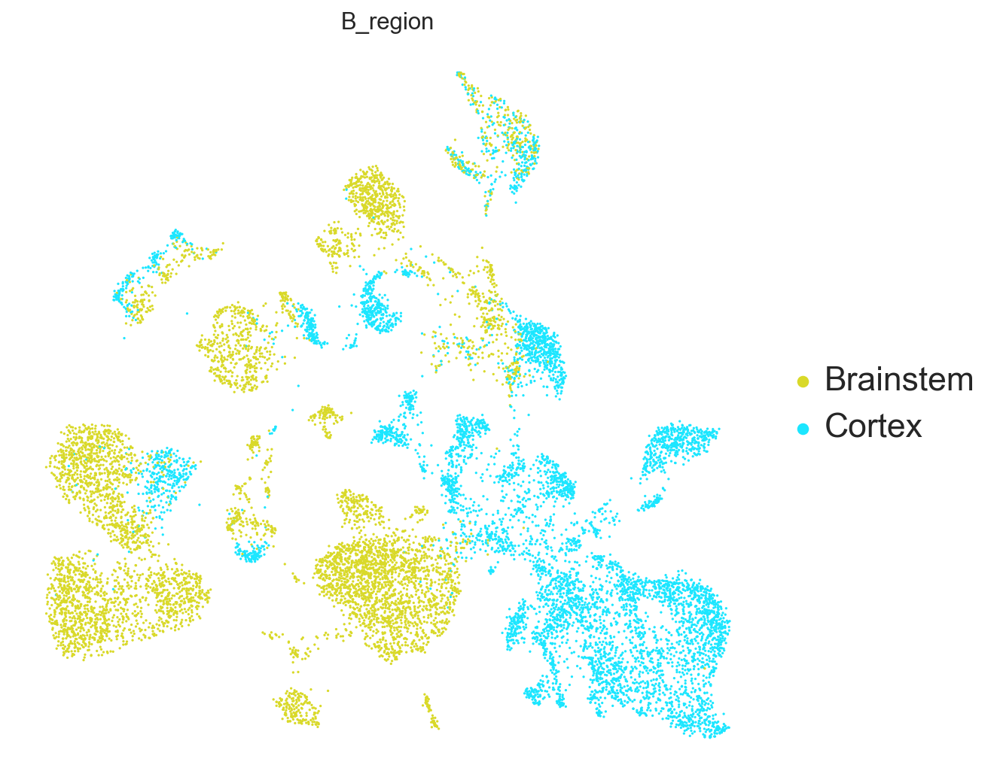

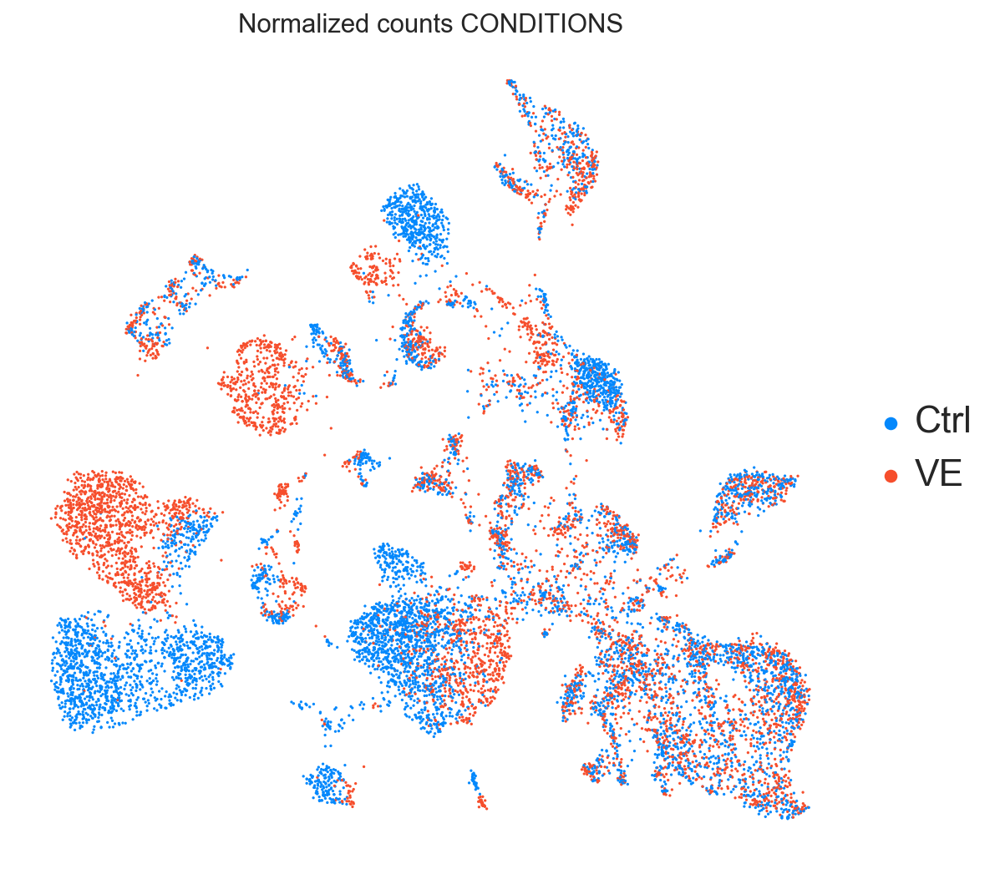

In [16]:
sc.set_figure_params(figsize=(8, 8))
markers = ['C1QA', 'P2RY12','CX3CR1', 'GRIN1','RBFOX3', 'AQP4','MOBP', 'TTR', 'DCN', 'VTN']
#sc.tl.umap(adata_clean, random_state=None)
#sc.tl.umap(adata_bbknn, random_state=None)
sc.pl.umap(
    adata_clean,
    color=['SampleID'],
    ncols=2,
    sort_order=False,
    frameon= False,
    edges = True,
    edges_width= 0.01,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    legend_fontsize=20,
    legend_fontoutline=2, title= 'Normalized counts SAMPLE ID'
)

sc.pl.umap(
    adata_clean,
    color=['PhenoGraph_clusters_clean'],
    ncols=2,
    sort_order=False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    legend_loc='on data',
    legend_fontsize=15,
    frameon= False,
    legend_fontoutline=2, title= 'Normalized counts PHENOGRAPH CLUSTERS'
)

sc.pl.umap(
    adata_clean,
    color=['B_region'],
    ncols=2,
    sort_order=False,
    #edges = True,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    #legend_loc='on data',
    legend_fontsize=20,
    frameon= False,
    legend_fontoutline=2
)


sc.pl.umap(
    adata_clean,
    color=['Condition'],
    palette=['#0488FC','#F64E2C'], # 'palette' specifies the colormap to use
    frameon= False,
    legend_fontsize=20,
    cmap='Spectral_r', title= 'Normalized counts CONDITIONS'
)

In [10]:
#adata_clean.obs.SampleID[1].split("_")[0]
# split the sample ID into its components and assign the mouse ID into a new column in the data frame adata_clean
adata_clean.obs.MouseID = adata_clean.obs.SampleID.apply(lambda row: row.split("_")[0])
adata_clean.obs['MouseID'] = adata_clean.obs.MouseID. astype('category')

/var/folders/3n/w61pt2yj0ml0qfnkhs19gl08fqhr6v/T/ipykernel_46027/39501011.py:3: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  adata_clean.obs.MouseID = adata_clean.obs.SampleID.apply(lambda row: row.split("_")[0])


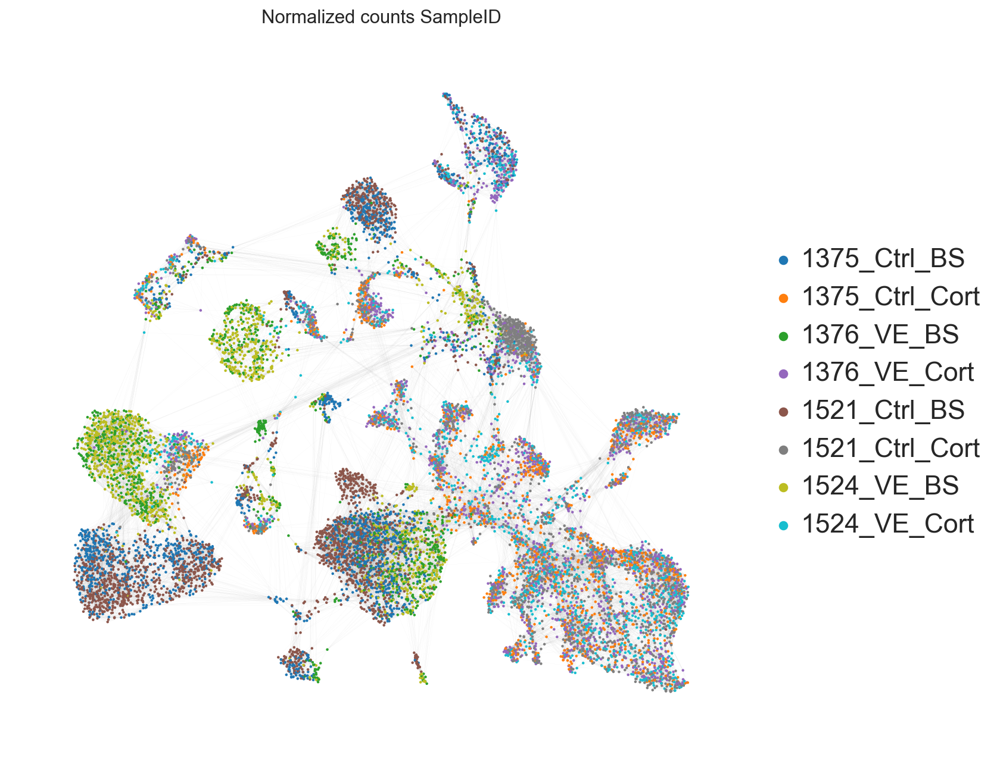

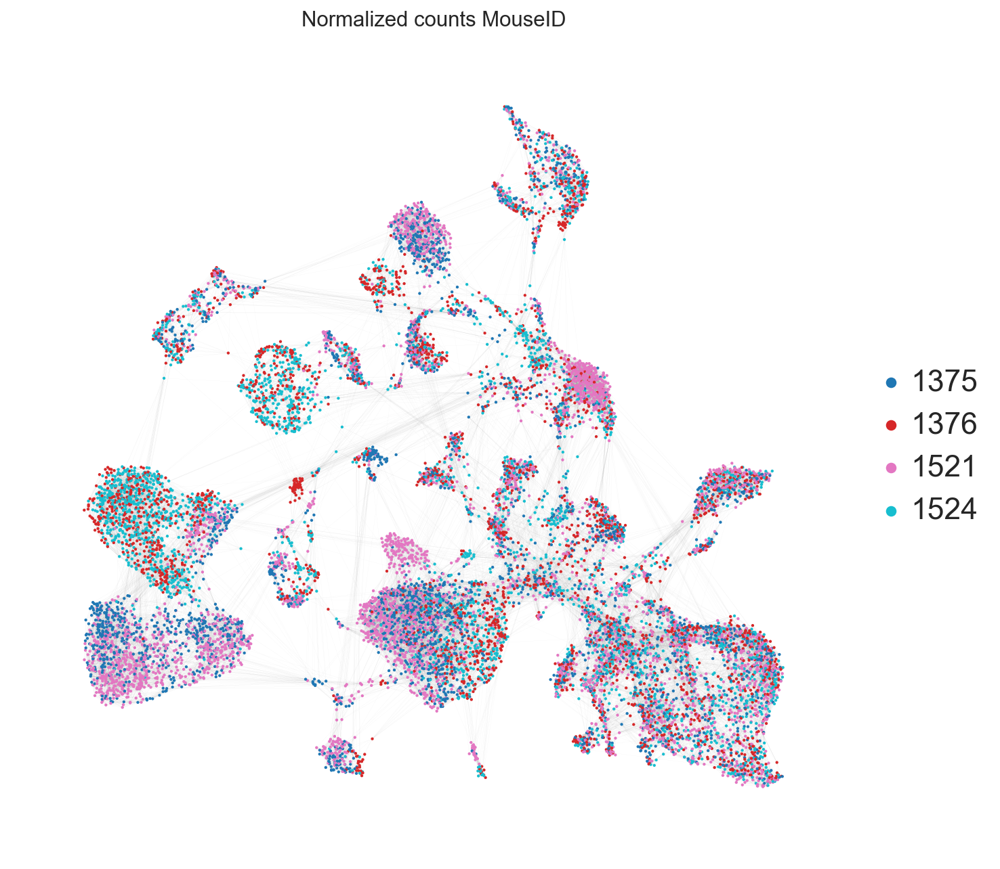

In [361]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.umap(
    adata_clean,
    color=['SampleID'],
    ncols=2,
    size = 16,
    sort_order=False,
    edges = True,
    edges_width= 0.01,
    frameon= False,
    palette='tab10', # 'palette' specifies the colormap to use
    legend_fontsize=20,
    legend_fontoutline=2, title= 'Normalized counts SampleID'
)

sc.pl.umap(
    adata_clean,
    color=['MouseID'],
    ncols=2,
    size = 15,
    sort_order=False,
    edges = True,
    frameon= False,
    edges_width= 0.01,
    palette='tab10', # 'palette' specifies the colormap to use
    legend_fontsize=20,
    legend_fontoutline=2, title= 'Normalized counts MouseID'
)


In [11]:
(adata_clean.obs.B_region).value_counts()

Brainstem    6845
Cortex       6796
Name: B_region, dtype: int64

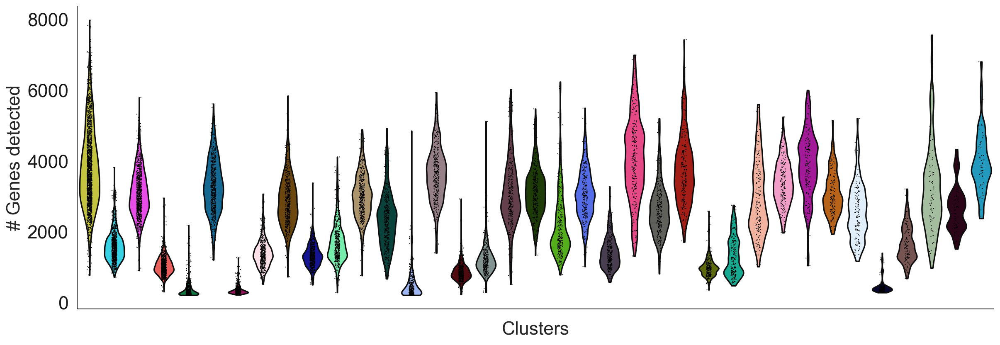

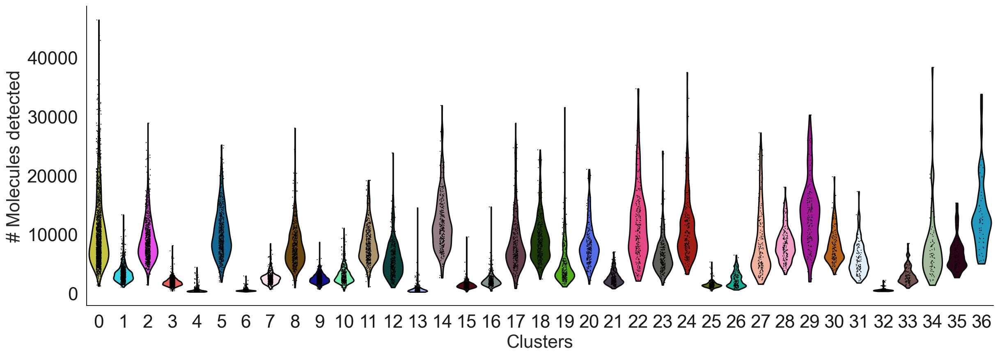

In [49]:
# nFeature_RNA = number of genes per cell
sc.set_figure_params(figsize=(14, 6), fontsize= 20)
plot1 = sc.pl.violin(adata_clean, ['nFeature_RNA'], palette = godsnot_64, bw = 0.2,
              groupby = 'PhenoGraph_clusters_clean', show= False)
plot1.set_xlabel("Clusters")
plot1.set_ylabel("# Genes detected")
plot1.set(xticklabels =[])
plot1.grid(False)
plot1.spines["top"].set_visible(False)
plot1.spines["left"].set_visible(True)
plot1.spines["bottom"].set_visible(True)
plot1.spines["right"].set_visible(False)


# nCount_RNA = number of UMIs per cell
plot2 = sc.pl.violin(adata_clean, ['nCount_RNA'], palette = godsnot_64, bw = 0.2,
              groupby = 'PhenoGraph_clusters_clean',  show= False)
#plot2.set_title("Number of molecules detected per cluster")
plot2.set_xlabel("Clusters")
plot2.set_ylabel("# Molecules detected")
#plot2.set(xticklabels =[])
plot2.grid(False)
plot2.spines["top"].set_visible(False)
plot2.spines["left"].set_visible(True)
plot2.spines["bottom"].set_visible(True)
plot2.spines["right"].set_visible(False)

## UMAP plots on gene expression of specific cell markers 

In [81]:
marker_genes = dict()
marker_genes['Microglia'] = ['CX3CR1', 'C1QA', 'PTPRC','P2RY12'] # , 'P2RY12'
#marker_genes['Excitatory Neurons'] = ['SLC17A7', 'SATB2', 'SLC17A6']
#marker_genes['Inhibitory Neurons'] = ['GAD1', 'GAD2']
marker_genes['Oligodendrocytes'] = ['MBP', 'MOBP']
marker_genes['Astrocytes'] = ['AQP4','GJA1']
marker_genes['OPC'] = ['NEU4','PDGFRA']
marker_genes['Myeloid'] = ['IL7R', 'CD74', 'CD8A','LY6C2','CCL5','PLAC8','CRIP1']
marker_genes['Vascular/Fibroblasts'] = ['DCN', 'VTN']
marker_genes['Neurons'] = ['GRIN1', 'RBFOX3']


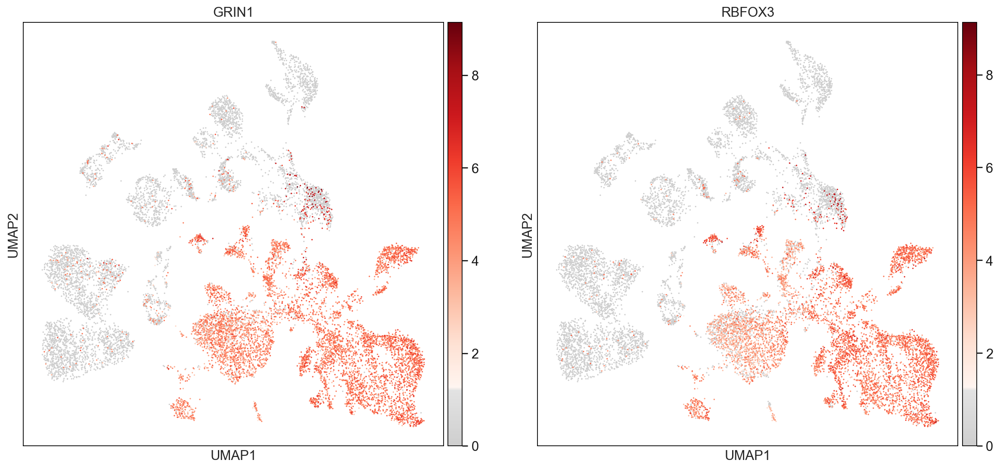

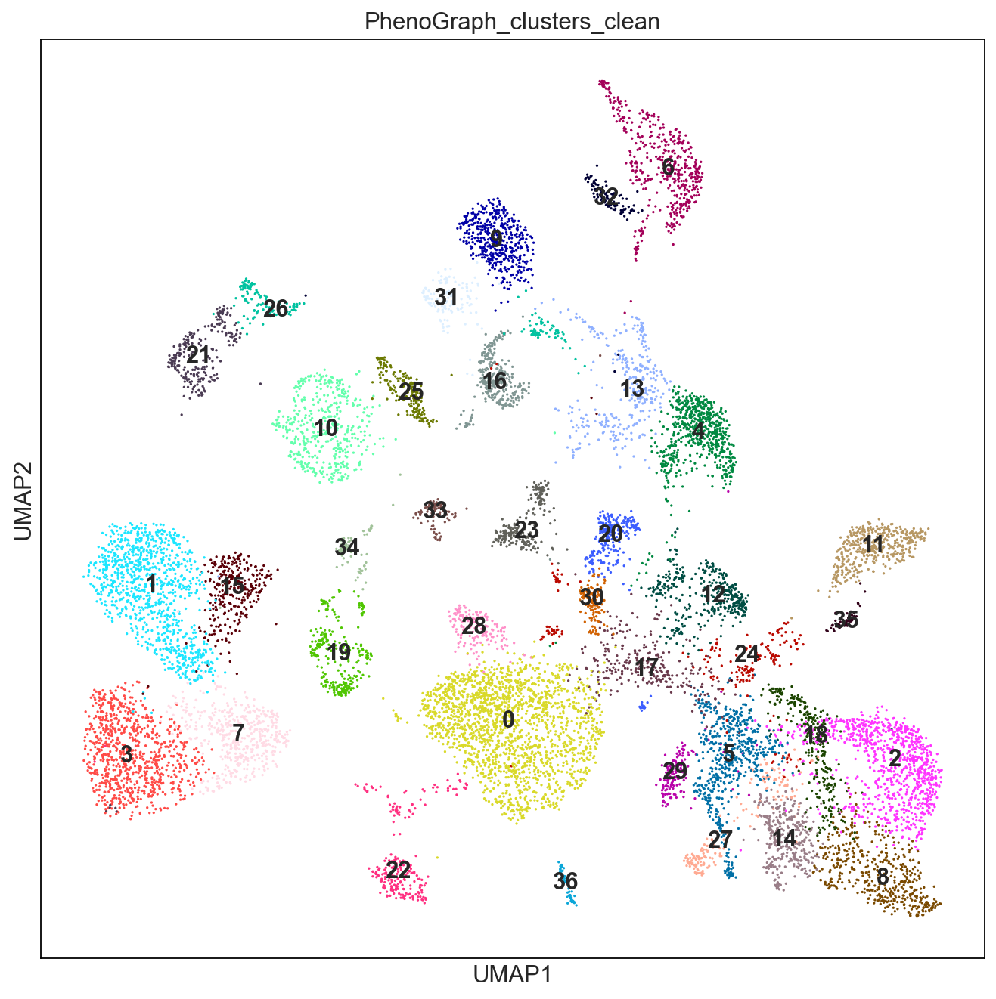

In [82]:
sc.set_figure_params(figsize=(8, 8))
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

#sc.pl.umap(adata_clean, color=marker_genes["Myeloid"], use_raw=False, color_map=mymap, frameon=False)
#sc.pl.umap(adata_clean, color=marker_genes['Excitatory Neurons'], use_raw=False, color_map=mymap)
#sc.pl.umap(adata_clean, color=marker_genes['Inhibitory Neurons'], use_raw=False, color_map=mymap)
#sc.pl.umap(adata_clean, color=marker_genes["Oligodendrocytes"], use_raw=False, color_map=mymap)
#sc.pl.umap(adata_clean, color=marker_genes['Astrocytes'], use_raw=False, color_map=mymap)
#sc.pl.umap(adata_clean, color=marker_genes['OPC'], use_raw=False, color_map=mymap)
#sc.pl.umap(adata_clean, color=marker_genes['Vascular_Fibro'], use_raw=False, color_map=mymap)
sc.pl.umap(adata_clean, color=marker_genes['Neurons'], use_raw=False, color_map=mymap)
plt.rcParams['figure.figsize'] = [10,10]
sc.pl.umap(adata_clean, color=['PhenoGraph_clusters_clean'], use_raw=False, color_map=mymap, legend_loc='on data')


categories: 0, 1, 2, etc.
var_group_labels: Microglia, Oligodendrocytes, Astrocytes, etc.


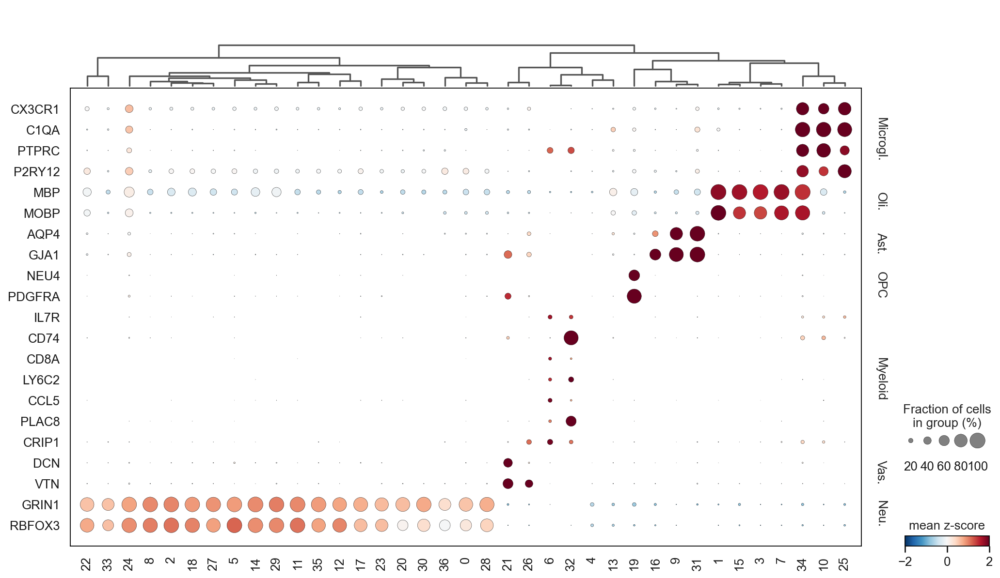

In [13]:
sc.set_figure_params(figsize=(5, 5))
adata_clean.layers['scaled'] = sc.pp.scale(adata_clean, copy=True).X

sc.pl.dotplot(adata=adata_clean, var_names=marker_genes, groupby=['PhenoGraph_clusters_clean_str'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True, return_fig= False, save= 'marker_accross_clusters')
#a1.add_totals().show()  

## T-test do identify marker genes between clusters

In [65]:
sc.set_figure_params(figsize=(10, 8))
sc.tl.rank_genes_groups(adata_clean, groupby='PhenoGraph_clusters_clean', key_added="ranked_genes_all_clusters", method='wilcoxon', use_raw = False)
sc.pl.rank_genes_groups(adata_clean, key = 'ranked_genes_all_clusters', fontsize=16)

/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes

In [66]:
n_genes = 10000
key_ad ='ranked_genes_all_clusters'
result = adata_clean.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)

pval_table

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,33_p,34_n,34_l,34_p,35_n,35_l,35_p,36_n,36_l,36_p
0,PCSK1N,5.850415,0.000000,PLCL1,7.762100,0.000000,KCNIP4,7.343576,0.000000,PTGDS,...,1.235467e-44,C1QC,8.493053,8.746248e-38,TSHZ2,9.872169,8.929823e-35,STAC,11.169091,8.073820e-34
1,RESP18,7.018418,0.000000,ST6GALNAC3,7.612889,0.000000,CAMK2A,5.756095,0.000000,APLP1,...,9.588962e-35,CTSS,8.490033,9.492014e-38,GM26883,8.710671,7.508377e-34,SCN3A,7.692958,9.521198e-34
2,STMN3,5.645102,0.000000,C4B,9.605696,0.000000,RGS6,6.175344,0.000000,PLP1,...,1.637464e-34,HEXB,7.404611,9.492014e-38,VWC2L,8.601855,2.061947e-33,GM44905,11.581476,1.541540e-33
3,ATP1B1,5.085834,0.000000,MOBP,8.714501,0.000000,CELF2,5.773988,0.000000,MAL,...,1.772957e-34,C1QA,8.799384,1.338826e-36,OLFM3,7.371879,1.001730e-31,FOXP2,9.586462,5.673837e-33
4,SCG5,4.793489,0.000000,MAP7,6.558056,0.000000,SLIT3,6.122800,0.000000,ENPP2,...,1.982347e-33,C1QB,8.322961,1.420449e-36,FRMPD4,6.608723,1.457056e-30,HDAC9,6.941790,1.315018e-32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,NINL,0.298181,0.062229,GART,0.108064,0.633694,CCDC71,-0.018112,0.999753,CFAP77,...,9.998338e-01,IFITM1,0.655840,9.977972e-01,PLSCR5,-22.596630,9.996826e-01,RP23.246J13.1,2.837011,9.976914e-01
9996,TBC1D2,0.259503,0.063023,RP23.386F15.2,-3.934335,0.633694,ARHGEF15,0.015810,0.999753,TXNDC15,...,9.998338e-01,CLPS,-0.096690,9.977972e-01,TMED6,-22.659931,9.996826e-01,CCDC65,0.454225,9.976914e-01
9997,GM26820,1.357116,0.063064,GM44812,-25.525461,0.633225,GPER1,-0.108977,0.999753,USF1,...,9.998338e-01,GM35339,0.904864,9.977972e-01,ERMAP,-22.951292,9.996826e-01,CES2H,2.560147,9.976914e-01
9998,DDX54,0.354267,0.063090,PTCH2,-25.561678,0.633225,ALG11,-0.130619,0.999753,ZKSCAN6,...,9.998338e-01,HMGA2,-0.156317,9.977972e-01,X2310008N11RIK,-22.934206,9.996826e-01,GM5608,1.979772,9.976914e-01


## Visualize marker genes using heatmap

In [67]:
cl_to_str = dict()
cl_to_str = {
    0 : '0',
    1 : '1',
    2 : '2',
    3 : '3',
    4 : '4',
    5 : '5',
    6 : '6',
    7 : '7',
    8 : '8',
    9 : '9',
    10 : '10',
    11 : '11',
    12 : '12',
    13 : '13',
    14 : '14',
    15 : '15',
    16 : '16',
    17 : '17',
    18 : '18',
    19 : '19',
    20 : '20',
    21 : '21',
    22 : '22',
    23 : '23',
    24 : '24',
    25 : '25',
    26 : '26',
    27 : '27',
    28 : '28',
    29 : '29',
    30 : '30',
    31 : '31',
    32 : '32',
    33 : '33',
    34 : '34',
    35 : '35',
    36 : '36'}

adata_clean.obs['PhenoGraph_clusters_clean_str'] = adata_clean.obs['PhenoGraph_clusters_clean'].map(cl_to_str).astype('category')

In [68]:
adata_clean.layers['scaled'] = sc.pp.scale(adata_clean, copy=True).X
sc.tl.rank_genes_groups(adata_clean, groupby='PhenoGraph_clusters_clean_str', use_raw = False, method='wilcoxon')


/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/fragkogs/opt/anaconda3/envs/std_new/lib/python3.8/site-packages/scanpy/tools/_rank_genes

{'heatmap_ax': <AxesSubplot:>,
 'groupby_ax': <AxesSubplot:xlabel='PhenoGraph_clusters_clean_str'>,
 'dendrogram_ax': <AxesSubplot:>,
 'gene_groups_ax': <AxesSubplot:>}

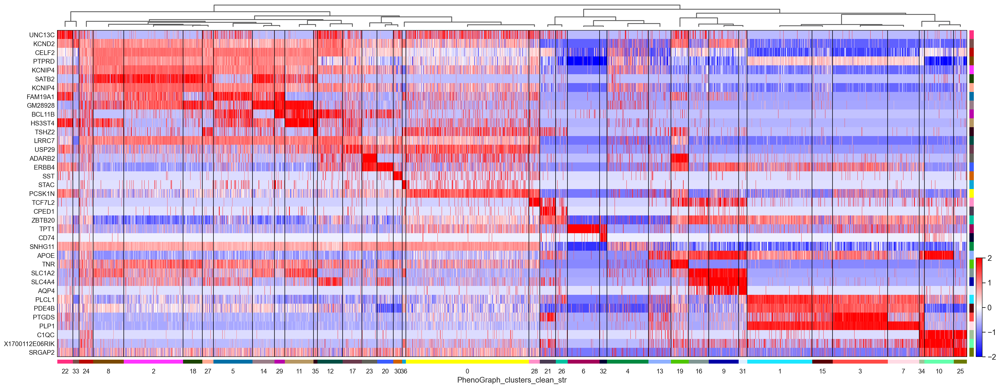

In [71]:
sc.pl.rank_genes_groups_heatmap(adata_clean, n_genes=1 , use_raw=False, swap_axes=True, vmin=-2, vmax=2, cmap='bwr', layer='scaled', figsize=(30,12), show=False)

## Assign identities

**Clusters 6, 4, 32 13 are a little weird***

**I have assigned 4 to Neurons and 13 to Microglia but it might not be right.**

In [26]:
cluster_dict = dict()
cluster_dict = {
    0 : 'Neurons',
    1 : 'Oligodendrocytes',
    2 : 'Neurons',
    3 : 'Oligodendrocytes',
    4 : 'UNKNOWN',
    5 : 'Neurons',
    6 : 'Myeloid',
    7 : 'Oligodendrocytes',
    8 : 'Neurons',
    9 : 'Astrocytes',
    10 : 'Microglia',
    11 : 'Neurons',
    12 : 'Neurons',
    13 : 'APOE-high',
    14 : 'Neurons',
    15 : 'Oligodendrocytes',
    16 : 'Astrocytes',
    17 : 'Neurons',
    18 : 'Neurons',
    19 : 'OPC',
    20 : 'Neurons',
    21 : 'Vascular_Fibro',
    22 : 'Neurons',
    23 : 'Neurons',
    24 : 'Neurons',
    25 : 'Microglia',
    26 : 'Vascular_Fibro',
    27 : 'Neurons',
    28 : 'Neurons',
    29 : 'Neurons',
    30 : 'Neurons',
    31 : 'Astrocytes',
    32 : 'Myeloid',
    33 : 'Neurons',
    34 : 'Mixed',
    35 : 'Neurons',
    36 : 'Neurons'}

In [27]:
adata_clean.obs['Broad_cell_types'] = adata_clean.obs['PhenoGraph_clusters_clean'].map(cluster_dict).astype('category')
adata_clean.obs['Broad_cell_types'].value_counts()

Neurons             7237
Oligodendrocytes    2580
Astrocytes           878
Microglia            637
UNKNOWN              623
Myeloid              591
Vascular_Fibro       416
APOE-high            337
OPC                  264
Mixed                 78
Name: Broad_cell_types, dtype: int64

## Cell number barplot

In [16]:
df_cellnum = adata_clean.obs['Broad_cell_types'].value_counts()
df_cellnum

Neurons             7860
Oligodendrocytes    2580
Astrocytes           878
Microglia            637
Myeloid              591
Vascular_Fibro       416
APOE-high            337
OPC                  264
Mixed                 78
Name: Broad_cell_types, dtype: int64

In [17]:
df_cellnum = df_cellnum.to_frame().reset_index()
df_cellnum.rename(columns = {'index' : 'Cell_types', 'Broad_cell_types' : 'N of Cells'}, inplace = True)
df_cellnum

,Cell_types,N of Cells
0,Neurons,7860
1,Oligodendrocytes,2580
2,Astrocytes,878
3,Microglia,637
4,Myeloid,591
5,Vascular_Fibro,416
6,APOE-high,337
7,OPC,264
8,Mixed,78


[Text(0.5, 1.0, 'Broad Clusters - Number of cells per cluster')]

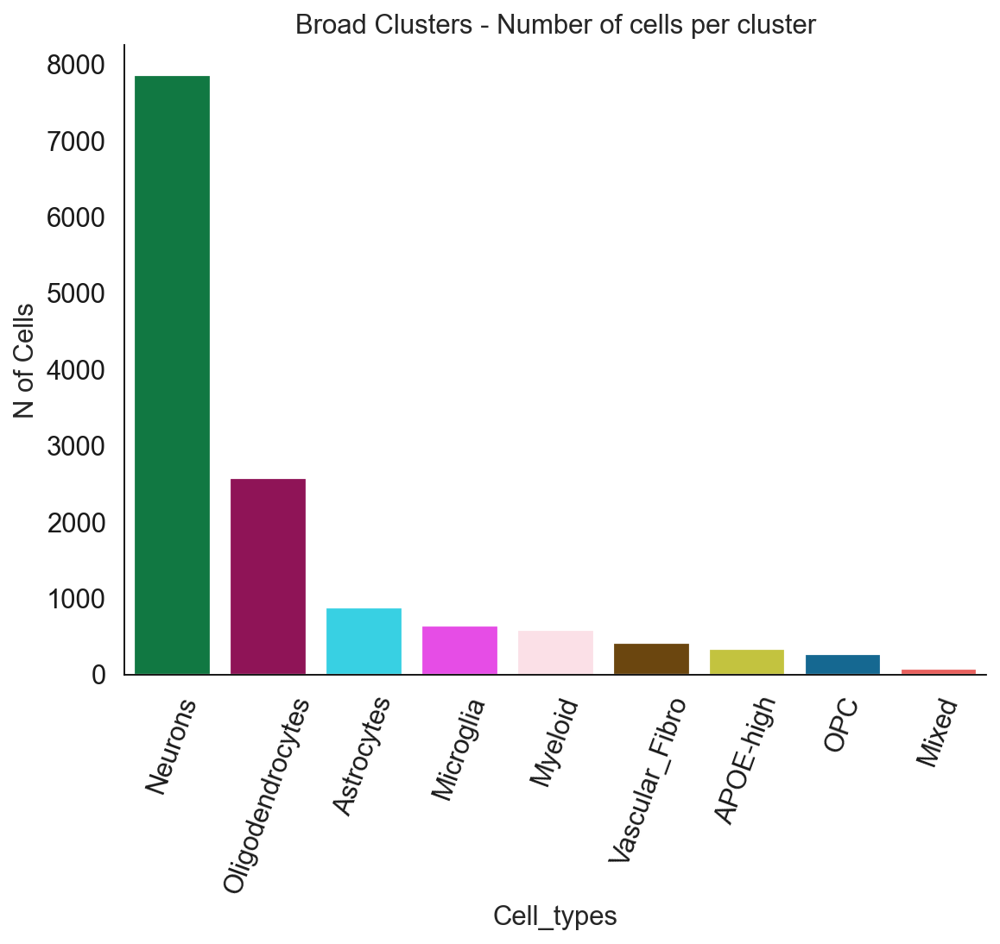

In [28]:
sc.set_figure_params(figsize=(8, 6))
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False

bar = sns.barplot(data = df_cellnum
            ,x = 'Cell_types'
            ,y = 'N of Cells',  order=df_cellnum.sort_values('N of Cells',ascending = False).Cell_types, 
                  palette=['#008941', '#A30059', '#1CE6FF', '#FF34FF', "#FFDBE5", "#7A4900", "#d9d929", "#006FA6", "#FF4A46"])

# 

plt.xticks(rotation=70)
plt.grid(False)
bar.set(title='Broad Clusters - Number of cells per cluster')

In [19]:
adata_clean.shape

(13641, 18730)

# UMAP Broad clusters

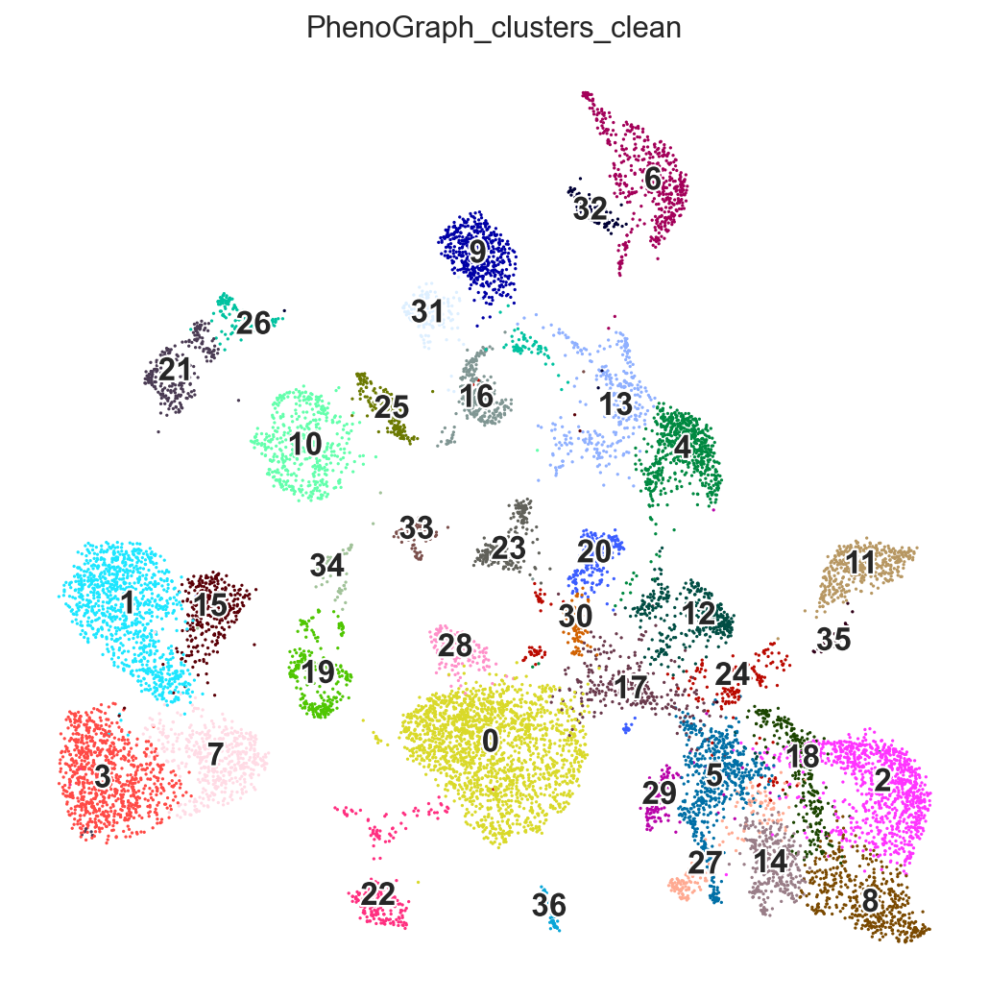

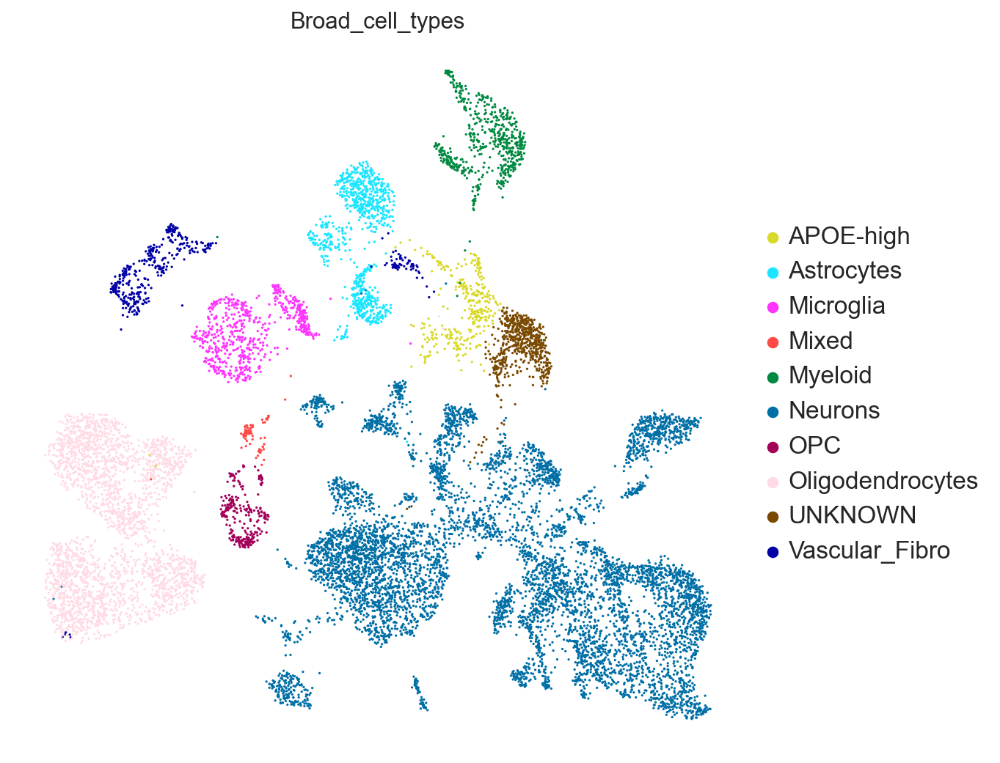

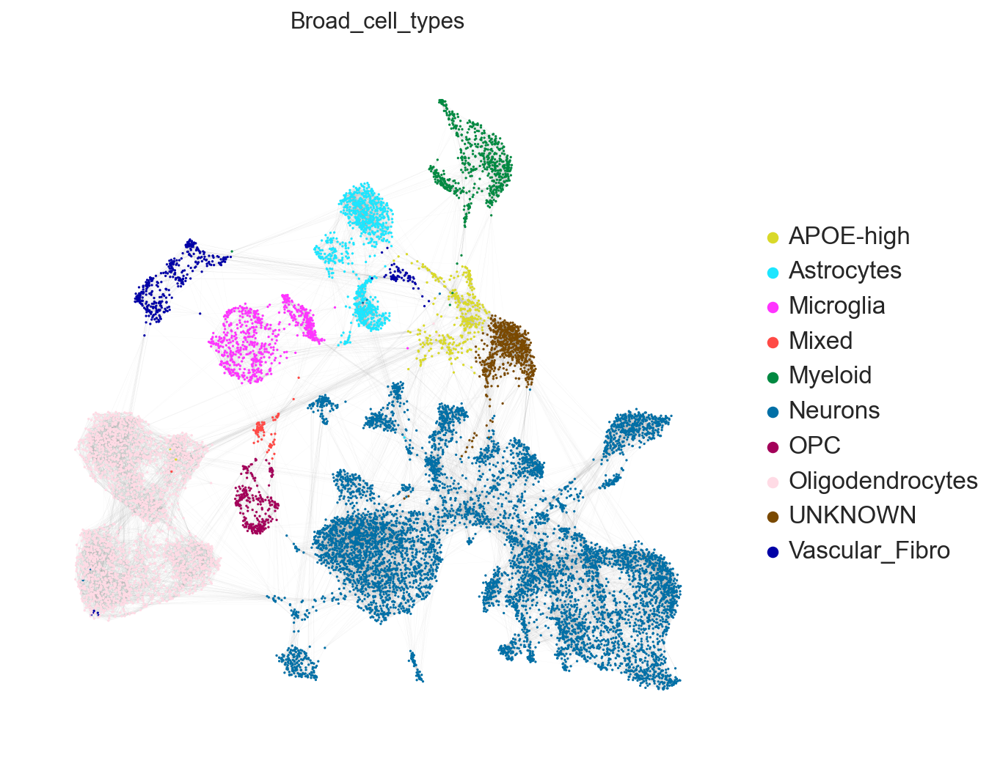

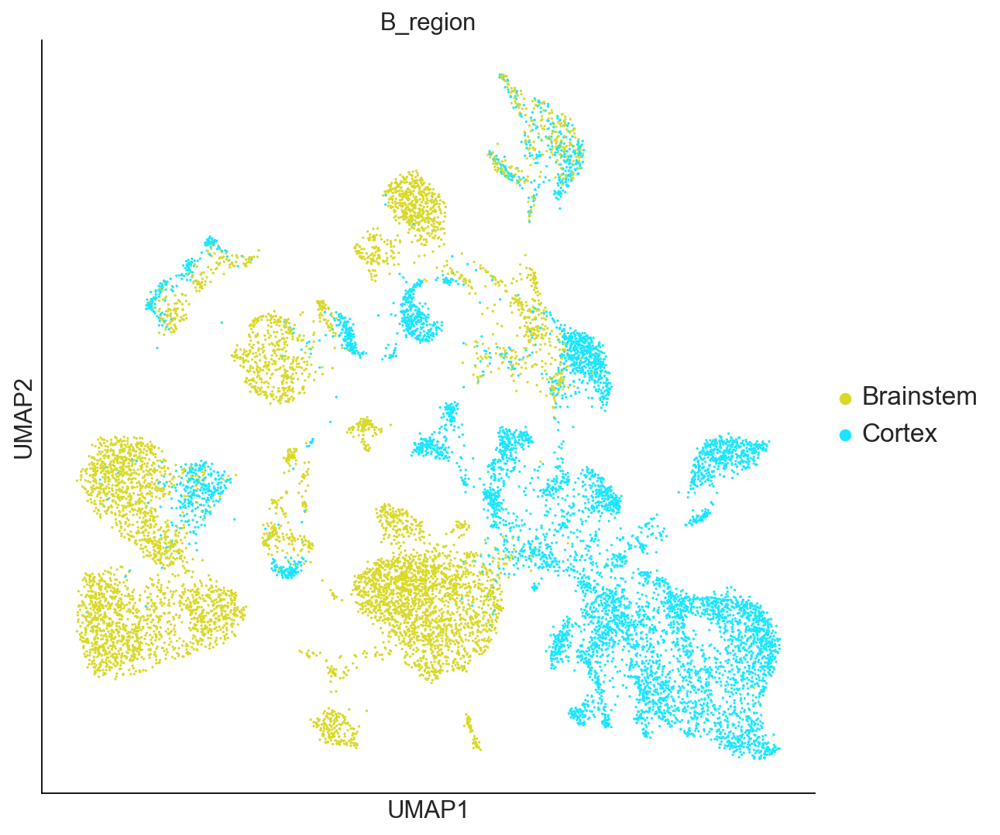

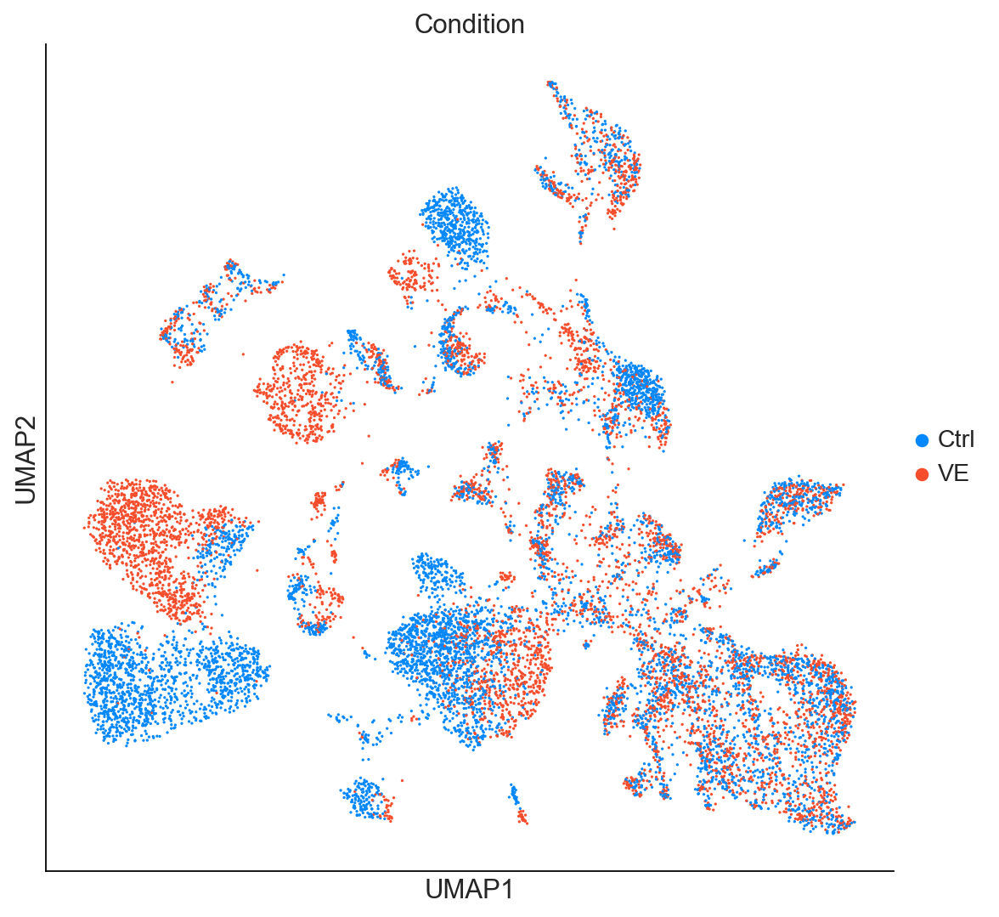

In [29]:
sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(
    adata_clean,
    color=['PhenoGraph_clusters_clean'],
    ncols=2,
    sort_order=False,
    #edges = True,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    legend_loc='on data',
    frameon = False,
    legend_fontsize=15,
    legend_fontoutline=2
)

sc.pl.umap(
    adata_clean,
    color=['Broad_cell_types'],
    ncols=2,
    sort_order=False,
    edges = False,
    edges_width= 0.01,frameon = False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    #legend_loc='on data',
    legend_fontsize=15,
    legend_fontoutline=2
)

sc.pl.umap(
    adata_clean,
    color=['Broad_cell_types'],
    ncols=2,
    sort_order=False,
    edges = True,
    edges_width= 0.01,frameon = False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    #legend_loc='on data',
    legend_fontsize=15,
    legend_fontoutline=2
)

sc.pl.umap(
    adata_clean,
    color=['B_region'],
    ncols=2,
    sort_order=False,
    #edges = True,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    #legend_loc='on data',
    legend_fontsize=15,
    legend_fontoutline=2
)

sc.pl.umap(
    adata_clean,
    color=['Condition'],
    palette=['#0488FC','#F64E2C'], # 'palette' specifies the colormap to use
)

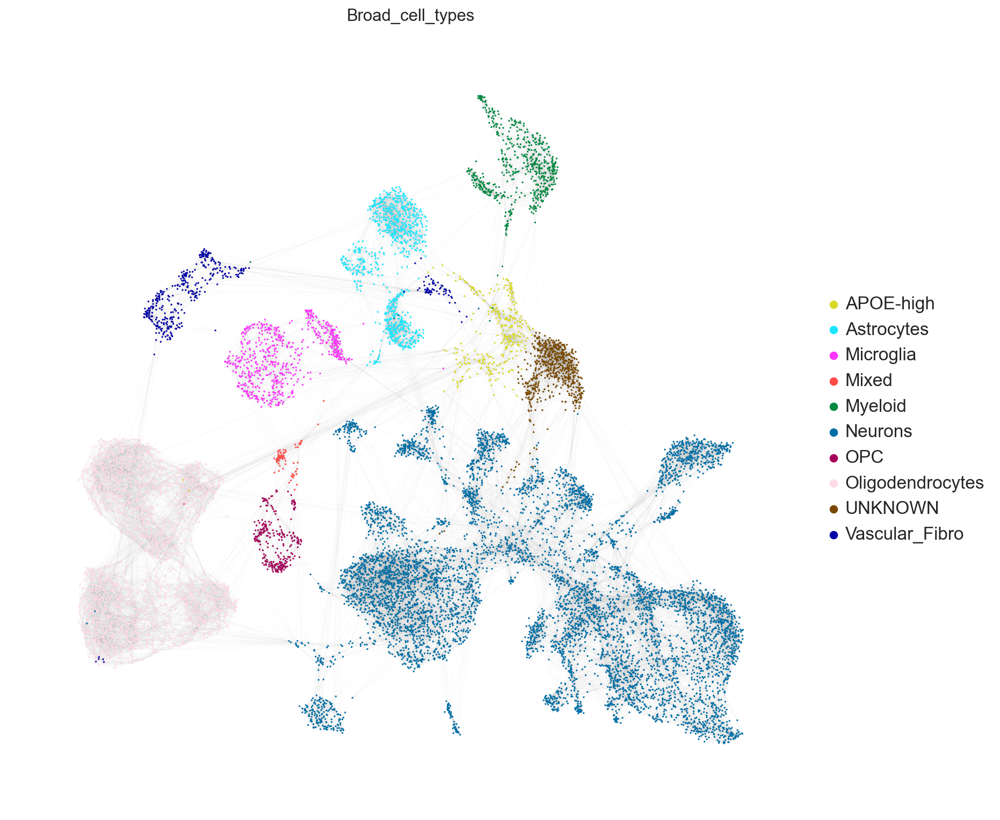

In [30]:
sc.set_figure_params(figsize=(12, 12))
sc.pl.umap(
    adata_clean,
    color=['Broad_cell_types'],
    ncols=2,
    sort_order=False,
    edges = True,
    edges_width= 0.01,frameon = False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    cmap='Spectral_r',
    #legend_loc='on data',
    legend_fontsize=15,
    legend_fontoutline=2
)

## CrossTabs of Condition per cluster

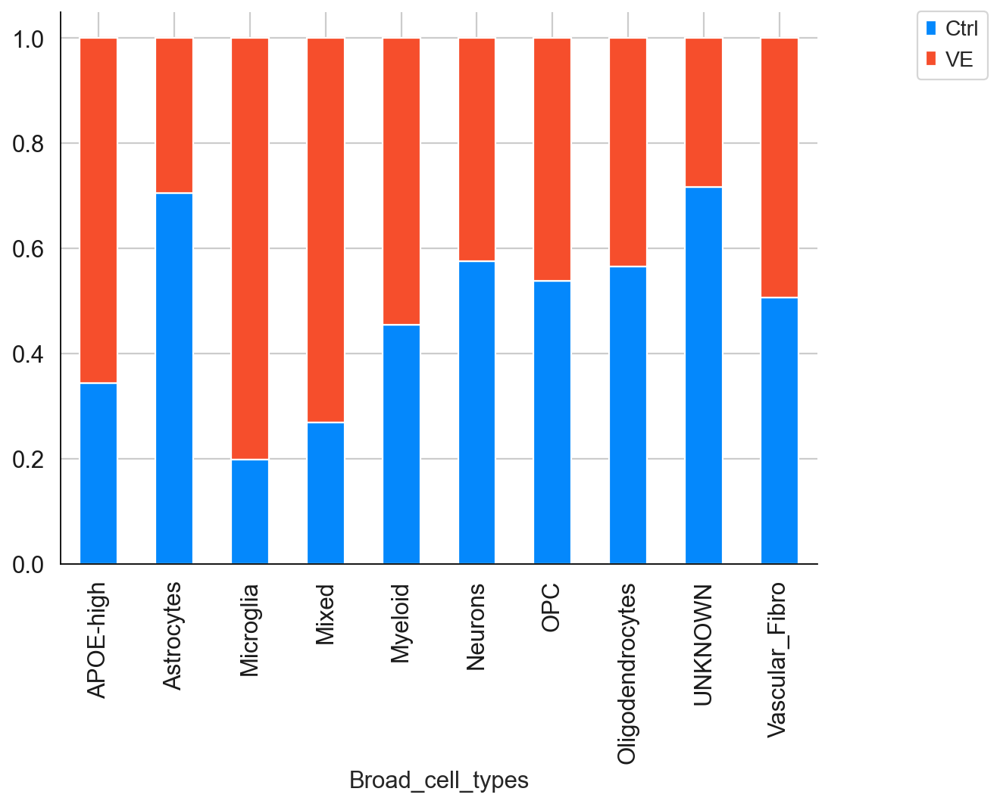

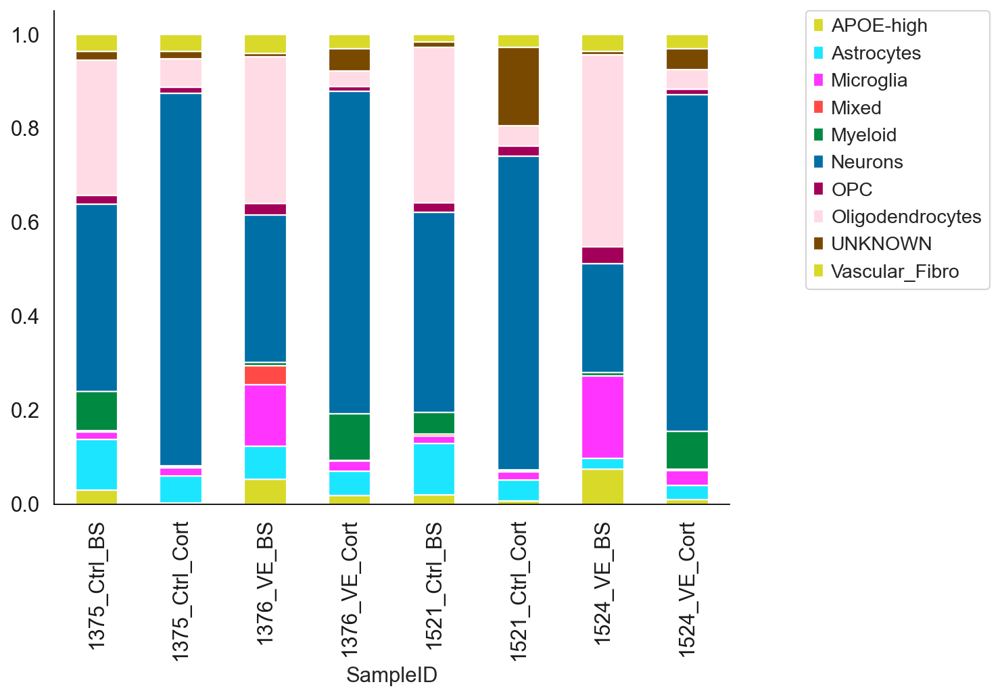

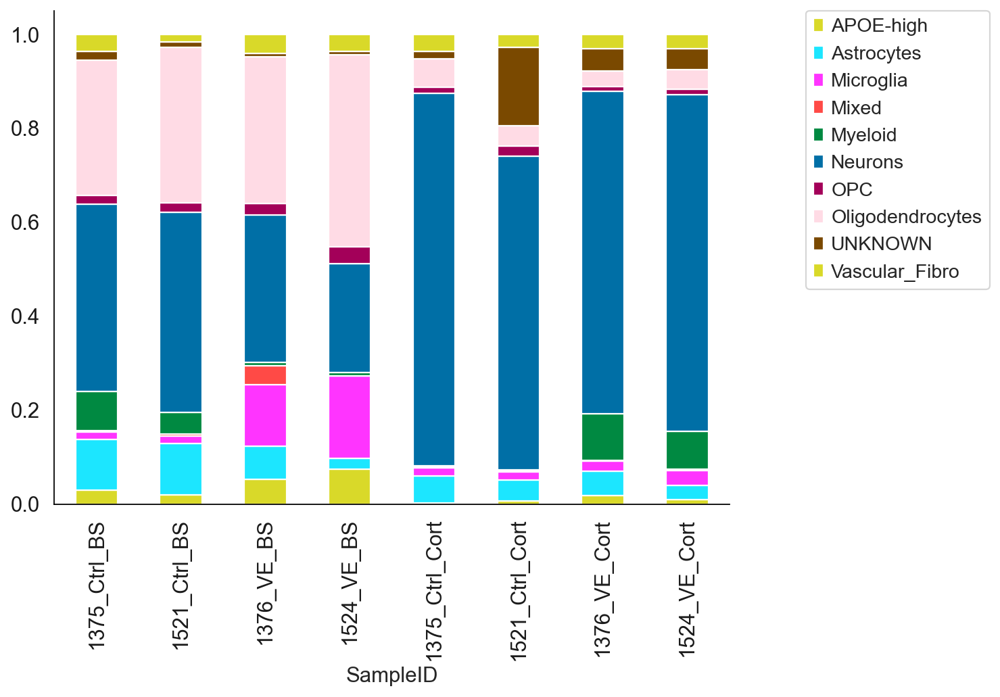

In [31]:
sc.set_figure_params(figsize=(12, 12))
tmp1 = pd.crosstab(adata_clean.obs['Broad_cell_types'],adata_clean.obs['Condition'], normalize='index')
tmp2 = pd.crosstab(adata_clean.obs['SampleID'],adata_clean.obs['Broad_cell_types'], normalize='index')
tmp3 = pd.crosstab(adata_clean.obs['MouseID'],adata_clean.obs['Broad_cell_types'], normalize='index')

tmp1.plot.bar(stacked=True, color = ['#0488FC','#F64E2C'], figsize = (8,6)).legend(loc='upper right', bbox_to_anchor=(1.24, 1.02));
tmp2.plot.bar(stacked=True, color = [ "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#FFDBE5", "#7A4900",],figsize = (8,6),).legend(loc='upper right', bbox_to_anchor=(1.4, 1.02));
#tmp3.plot.bar(stacked=True, color = ["tab10"],figsize = (8,6),).legend(loc='upper right', bbox_to_anchor=(1.4, 1.02));
plt.grid(False)

# reordered data frame 
tmp2 = tmp2.reindex(['1375_Ctrl_BS',  '1521_Ctrl_BS', '1376_VE_BS','1524_VE_BS',
              '1375_Ctrl_Cort', '1521_Ctrl_Cort', '1376_VE_Cort', '1524_VE_Cort'])
tmp2.plot.bar(stacked=True, color = [ "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#FFDBE5", "#7A4900",],figsize = (8,6),).legend(loc='upper right', bbox_to_anchor=(1.4, 1.02));
plt.grid(False)

## Composition analysis

In [32]:
import warnings
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz

warnings.filterwarnings("ignore")


In [33]:
adata_brainstem = deepcopy(adata_clean)
adata_brainstem = adata_brainstem[adata_brainstem.obs['B_region'].isin(['Brainstem']),:]
adata_brainstem.shape

(6845, 18730)

### Create a table of counts

In [58]:
cell_counts = pd.DataFrame()

In [59]:
Sample_names = adata_brainstem.obs.SampleID.unique()

for sample in Sample_names:
    print(sample)
    counts = adata_brainstem.obs[adata_brainstem.obs.SampleID == sample]['Broad_cell_types'].value_counts()
    cell_counts[sample] = counts

1375_Ctrl_BS
1521_Ctrl_BS
1524_VE_BS
1376_VE_BS


In [60]:
cell_counts = cell_counts.transpose()
#cell_counts = cell_counts[['APOE-high', 'Astrocytes', 'Microglia', 'Mixed', 'Neurons', 'OPC', 'Oligodendrocytes', 'Unknown_Ribo', 'Vascular_Fibro']]
cell_counts = cell_counts[['Astrocytes', 'Microglia', 'Neurons', 'OPC', 'Oligodendrocytes', 'Myeloid','Vascular_Fibro']]
cell_counts['SampleID'] = cell_counts.index
#cell_counts['Condition'] = ['Control', 'Control', 'VE', 'VE']
cell_counts

,Astrocytes,Microglia,Neurons,OPC,Oligodendrocytes,Myeloid,Vascular_Fibro,SampleID
1375_Ctrl_BS,200,29,736,33,533,154,67,1375_Ctrl_BS
1521_Ctrl_BS,250,36,971,46,758,106,36,1521_Ctrl_BS
1524_VE_BS,36,267,353,56,623,10,55,1524_VE_BS
1376_VE_BS,84,155,373,30,371,9,48,1376_VE_BS


In [61]:
data_mouse = dat.from_pandas(cell_counts, covariate_columns=["SampleID"])

# Extract condition from mouse name and add it as an extra column to the covariates
print(data_mouse.X)
print(data_mouse.obs)

[[200.  29. 736.  33. 533. 154.  67.]
 [250.  36. 971.  46. 758. 106.  36.]
 [ 36. 267. 353.  56. 623.  10.  55.]
 [ 84. 155. 373.  30. 371.   9.  48.]]
                  SampleID
1375_Ctrl_BS  1375_Ctrl_BS
1521_Ctrl_BS  1521_Ctrl_BS
1524_VE_BS      1524_VE_BS
1376_VE_BS      1376_VE_BS


In [62]:
data_mouse.obs['Condition'] = ['Control', 'Control', 'VE', 'VE']
data_mouse

AnnData object with n_obs × n_vars = 4 × 7
    obs: 'SampleID', 'Condition'

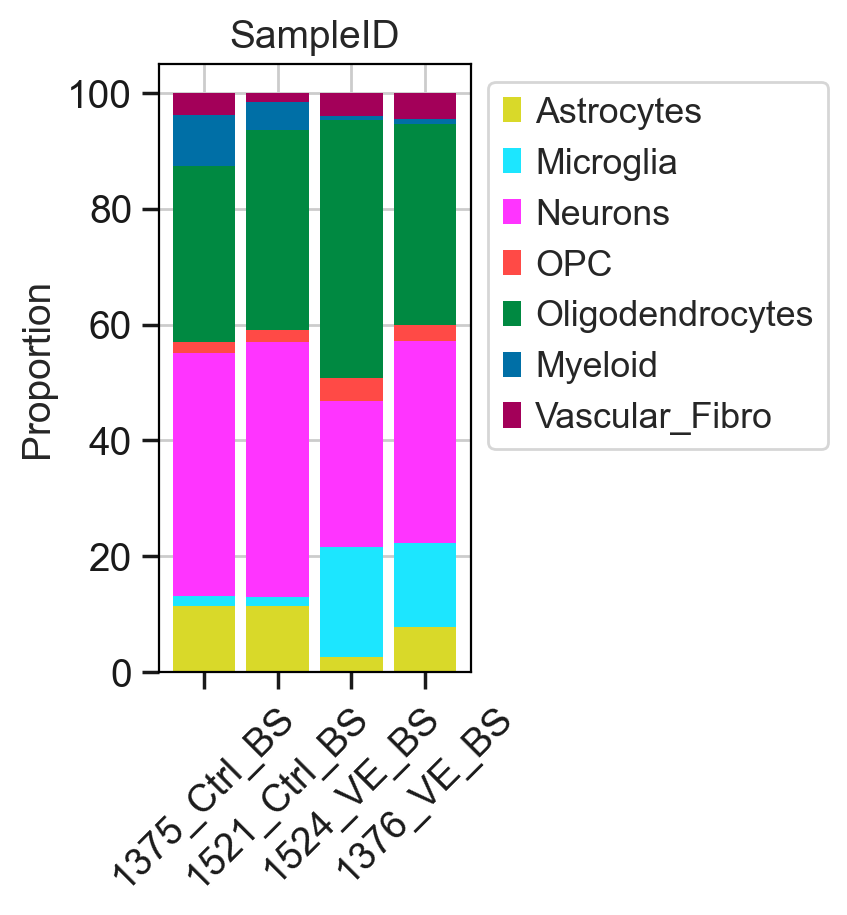

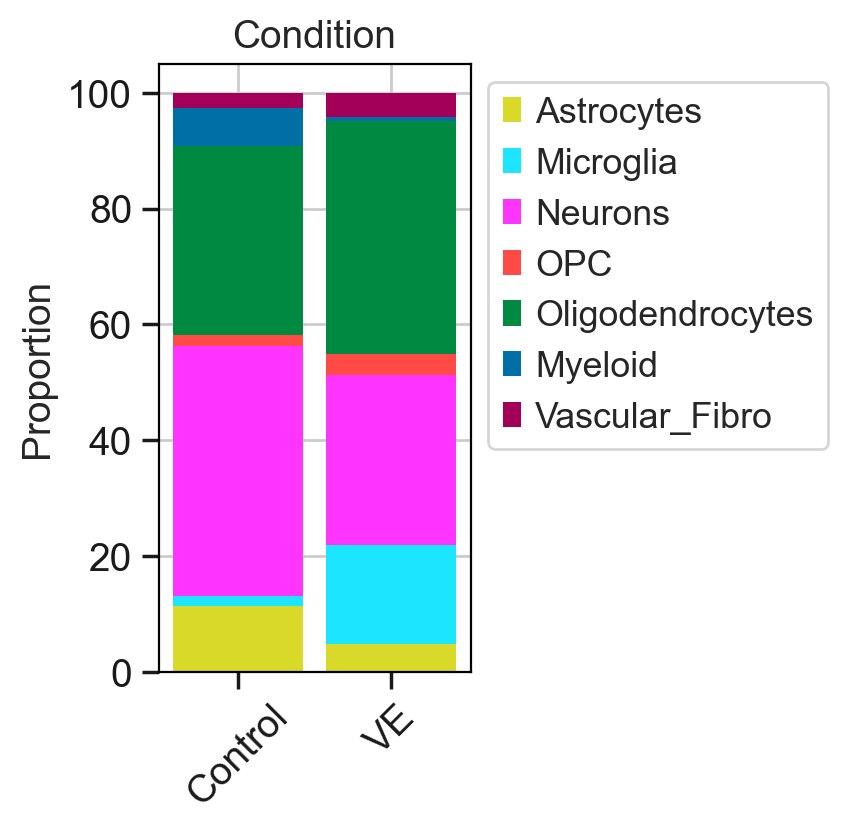

In [63]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap1 = matplotlib.colors.ListedColormap(godsnot_64)


sc.set_figure_params(figsize=(2, 4))
# Stacked barplot for each sample
viz.stacked_barplot(data_mouse, feature_name="SampleID", cmap= cmap1)

plt.show()

# Stacked barplot for the levels of "Condition"
viz.stacked_barplot(data_mouse, feature_name="Condition", cmap= cmap1)
plt.show()

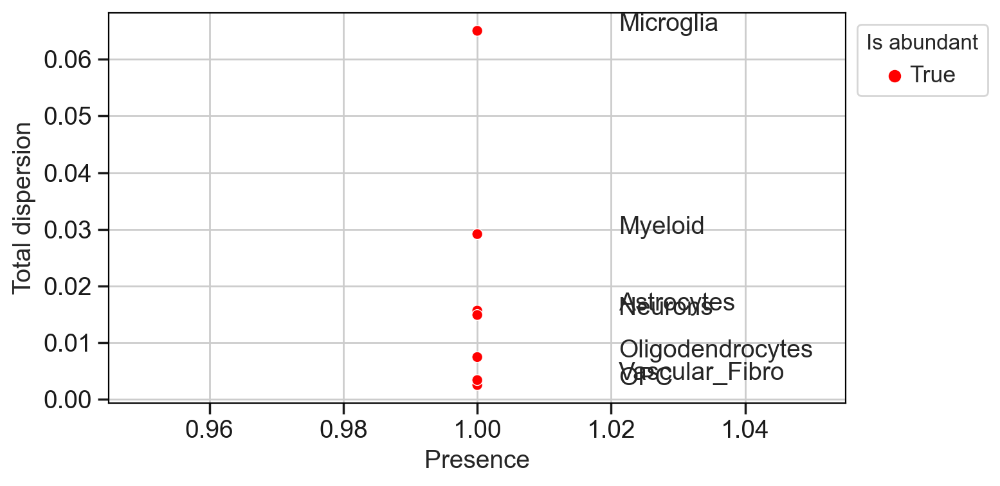

In [64]:
sc.set_figure_params(figsize=(8, 4))
viz.rel_abundance_dispersion_plot(
    data=data_mouse,
    abundant_threshold=0.9
)
plt.show()

### Run analysis

In [65]:
from sccoda.util import comp_ana as mod
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz


In [66]:
model_all = mod.CompositionalAnalysis(data_mouse, formula="Condition", reference_cell_type="automatic")

Automatic reference selection! Reference cell type set to OPC


In [67]:
all_results = model_all.sample_hmc()
all_results.summary()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:44<00:00, 445.42it/s]


MCMC sampling finished. (57.708 sec)
Acceptance rate: 56.8%
Compositional Analysis summary:

Data: 4 samples, 7 cell types
Reference index: 3
Formula: Condition

Intercepts:
                  Final Parameter  Expected Sample
Cell Type                                         
Astrocytes                  2.462       169.117559
Microglia                   0.915        36.002706
Neurons                     3.850       677.625036
OPC                         1.126        44.460186
Oligodendrocytes            3.615       535.710601
Myeloid                     1.848        91.523346
Vascular_Fibro              1.279        51.810565


Effects:
                                  Final Parameter  Expected Sample  \
Covariate       Cell Type                                            
Condition[T.VE] Astrocytes               0.000000       156.149353   
                Microglia                1.906664       223.738258   
                Neurons                  0.000000       625.663658   
      

For the effect summary, the first column again shows the inferred parameters for all combinations of covariates and cell types. Most important is the distinctions between zero and non-zero entries A value of zero means that no statistically credible effect was detected. For a value other than zero, a credible change was detected. A positive sign indicates an increase, a negative sign a decrease in abundance.

**Microlgia INCREASE in VE**

**Astrocytes DECREASE in VE**

**Neurons DECREASE in VE**


In [68]:
print(all_results.credible_effects())

Covariate        Cell Type       
Condition[T.VE]  Astrocytes          False
                 Microglia            True
                 Neurons             False
                 OPC                 False
                 Oligodendrocytes    False
                 Myeloid              True
                 Vascular_Fibro      False
Name: Final Parameter, dtype: bool


### Save results of composition analysis

In [ ]:
# saving
path = "test"
all_results.save(path)

# loading
with open(path, "rb") as f:
    all_results = pkl.load(f)

all_results.summary()

### Other models

In [182]:
from sccoda.model import other_models as om
ancom_model = om.AncomModel(data_mouse, covariate_column="Condition")
ancom_model.fit_model()
print(ancom_model.ancom_out)

(                  W  Reject null hypothesis
APOE-high         1                   False
Astrocytes        0                   False
Microglia         3                    True
Mixed             0                   False
Neurons           0                   False
OPC               1                   False
Oligodendrocytes  1                   False
Unknown_Ribo      3                    True
Vascular_Fibro    1                   False, Percentile         0.0     25.0    50.0    75.0    100.0  0.0     25.0   \
Group            Control Control Control Control Control     VE      VE   
APOE-high           44.0   46.50    49.0   51.50    54.0   63.0   75.25   
Astrocytes         200.0  212.50   225.0  237.50   250.0   36.0   48.00   
Microglia           29.0   30.75    32.5   34.25    36.0  155.0  183.00   
Mixed                5.0    6.50     8.0    9.50    11.0    1.0   12.75   
Neurons            770.0  827.00   884.0  941.00   998.0  364.0  368.75   
OPC                 33.0   36.25 

In [ ]:
scdc_model = om.scdney_model(data_mouse, covariate_column="Condition")
result, _ = scdc_model.analyze(r_home=r_home, r_path=r_path)
print(result)

In [196]:
alr_t_model = om.ALRModel_ttest(data_mouse, covariate_column = "Condition")
alr_t_model.fit_model(reference_cell_type = 4)
print(alr_t_model.var)
print(alr_t_model.p_val)

Empty DataFrame
Columns: []
Index: [APOE-high, Astrocytes, Microglia, Mixed, Neurons, OPC, Oligodendrocytes, Unknown_Ribo, Vascular_Fibro]
[0.06972328916276622, 0.3021582687696851, 0.012031633312075359, 0.7232521474790208, 1, 0.11678050180913657, 0.1846840265146768, 0.03309718875905374, 0.1839692273791281]


# Save result for broad clusters (adata_clean)

In [23]:
#adata_clean.write_h5ad(outdir+'adata_CX3_cell_types_update_myeloid_cells.h5ad')
#adata_clean.write_h5ad(outdir+'adata_CX3_cell_types.h5ad')

**Load cell types with uknown ribo cluster**

In [9]:
adata_clean = sc.read_h5ad(outdir+'adata_CX3_cell_types.h5ad')

In [10]:
adata_clean.obs['Broad_cell_types'].value_counts()

Neurons             7860
Oligodendrocytes    2580
Astrocytes           878
Microglia            637
Unknown_Ribo         591
Vascular_Fibro       416
APOE-high            337
OPC                  264
Mixed                 78
Name: Broad_cell_types, dtype: int64

**Load cell types with UPDATED MYELOID cluster**

In [8]:
adata_clean = sc.read_h5ad(outdir+'adata_CX3_cell_types_update_myeloid_cells.h5ad')

In [10]:
adata_clean.obs['Broad_cell_types'].value_counts()

Neurons             7860
Oligodendrocytes    2580
Astrocytes           878
Microglia            637
Myeloid              591
Vascular_Fibro       416
APOE-high            337
OPC                  264
Mixed                 78
Name: Broad_cell_types, dtype: int64

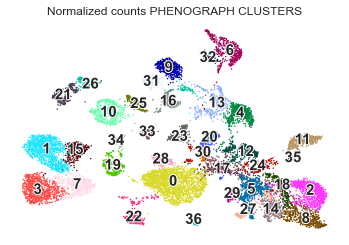

In [11]:
sc.pl.umap(
    adata_clean,
    color=['PhenoGraph_clusters_clean'],
    ncols=2,
    sort_order=False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    legend_loc='on data',
    legend_fontsize=15,
    frameon= False,
    legend_fontoutline=2, title= 'Normalized counts PHENOGRAPH CLUSTERS'
)

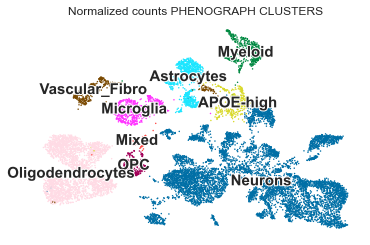

In [12]:
sc.pl.umap(
    adata_clean,
    color=['Broad_cell_types'],
    ncols=2,
    sort_order=False,
    palette=godsnot_64, # 'palette' specifies the colormap to use
    legend_loc='on data',
    legend_fontsize=15,
    frameon= False,
    legend_fontoutline=2, title= 'Normalized counts PHENOGRAPH CLUSTERS'
)